In [1]:
from pyrosm import OSM, get_data
import osmnx as ox

In [2]:
%%time
fp = get_data("London")

Downloaded Protobuf data 'London.osm.pbf' (81.38 MB) to:
'/var/folders/b6/h942qzzd5f721pfd0b3d411m0000gn/T/pyrosm/London.osm.pbf'
CPU times: user 746 ms, sys: 756 ms, total: 1.5 s
Wall time: 2min 15s


In [3]:
%%time
osm = OSM(fp)

CPU times: user 656 µs, sys: 730 µs, total: 1.39 ms
Wall time: 782 µs


In [4]:
%%time
buildings = osm.get_buildings()

CPU times: user 1min 4s, sys: 3.16 s, total: 1min 7s
Wall time: 1min 7s


In [5]:
import geopandas as gpd
import pandas as pd
import numpy as np

In [6]:
buildings = buildings.to_crs('epsg:27700')
buildings = buildings[buildings.geometry.type=='Polygon']

In [7]:
named = buildings[~buildings.name.isnull()]
noned = buildings[buildings.name.isnull()]

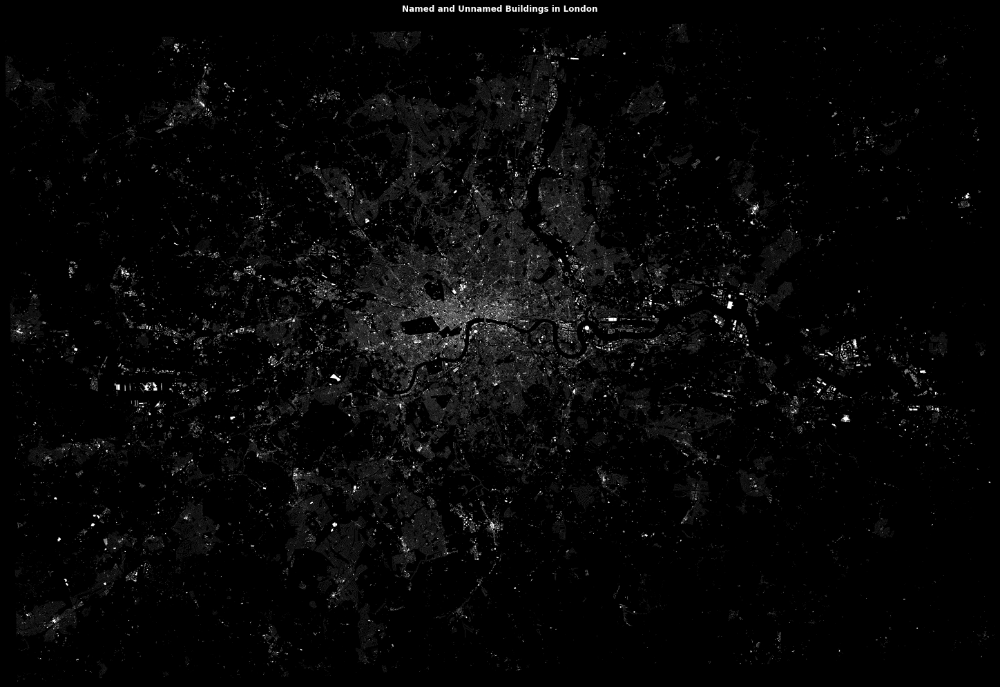

In [8]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1, figsize=(20, 20), 
                       facecolor='k',
                       constrained_layout=True, 
                       subplot_kw=dict(aspect='equal'))

noned.plot(ax=ax, color='w', alpha=0.5)
named.plot(ax=ax, color='w', alpha=1.0)
    
ax.set_title("Named and Unnamed Buildings in London", color='w', weight='bold')

ax.margins(0)
ax.axis('off')
    
fig.savefig('urban-morphology-london-names.png', facecolor=fig.get_facecolor(), dpi=300, bbox_inches='tight')

In [9]:
import random

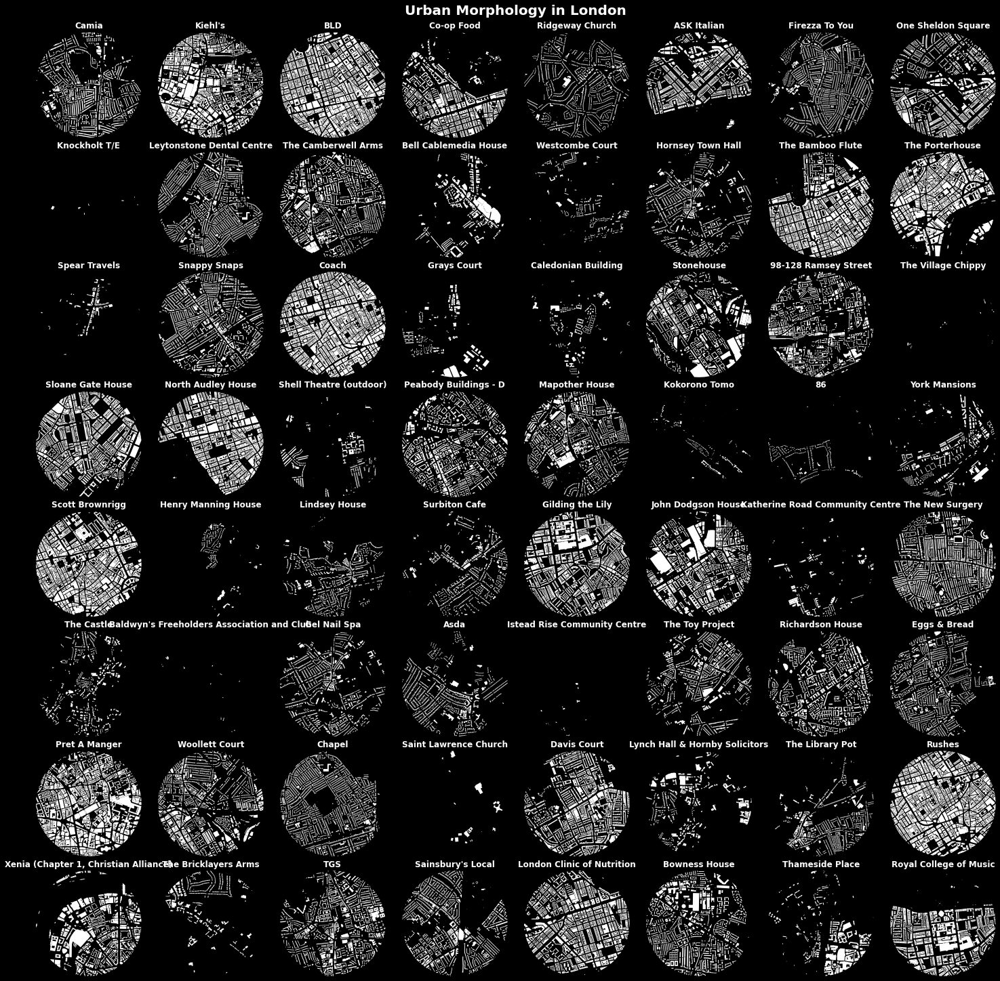

In [10]:
fig, axs = plt.subplots(8, 8, figsize=(20, 20), 
                        facecolor='k',
                        constrained_layout=True, 
                        subplot_kw=dict(aspect='equal'))

axs = axs.ravel()

for i in np.arange(0, 64):
    
    building = named.iloc[random.randint(0, named.shape[0])]
    centroid = building.geometry.centroid
    
    street = building['addr:street']
    number = building['addr:housenumber']
    name = building['name']
    
    buffer = gpd.GeoSeries(centroid.buffer(800), crs='epsg:27700')
    bounds = buffer.bounds.iloc[0]
    
    subset = gpd.overlay(gpd.GeoDataFrame(buildings.geometry), 
                         gpd.GeoDataFrame(geometry=gpd.GeoSeries(centroid.buffer(800), crs='epsg:27700')), 
                         how='intersection')
    
    subset.plot(ax=axs[i], color='w')
    
    west, south, east, north = bounds
    axs[i].set_ylim((south, north))
    axs[i].set_xlim((west, east))
    axs[i].set_title(f"{name}", color='w', weight='bold')

    axs[i].margins(0)
    axs[i].axis('off')
    
fig.suptitle('Urban Morphology in London', color='w', size=20, weight='bold')
fig.savefig('urban-morphology-london.png', facecolor=fig.get_facecolor(), dpi=300, bbox_inches='tight')

In [128]:
frames = {}
counter = 0

while counter < 64:
    
    i = random.randint(0, named.shape[0])

    building = named.iloc[i]
    centroid = building.geometry.centroid
    
    buffer = gpd.GeoSeries(centroid.buffer(1000), crs='epsg:27700')
    bounds = buffer.envelope[0]

    cutout = gpd.overlay(buildings, gpd.GeoDataFrame(geometry=gpd.GeoSeries(bounds, crs='epsg:27700')))

    if cutout.shape[0] > 1000:
        dissolved = cutout.dissolve()
        
        frames[i] = {'geometry': dissolved.geometry[0],
                     'bounds': bounds,
                     'street': building['addr:street'],
                     'number': building['addr:housenumber'],
                     'name': building['name']}
        
        counter += 1
        
    else: 
        print(f"miss | counter: {counter}")
        pass

miss | counter: 7
miss | counter: 7
miss | counter: 9
miss | counter: 24
miss | counter: 30
miss | counter: 35
miss | counter: 41
miss | counter: 42
miss | counter: 48
miss | counter: 48


In [248]:
results = pd.DataFrame(frames).T.reset_index()
results.head()

/Users/andrewrenninger/anaconda3/envs/tinkering/lib/python3.9/site-packages/pandas/core/dtypes/inference.py:383: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
/Users/andrewrenninger/anaconda3/envs/tinkering/lib/python3.9/site-packages/pandas/core/dtypes/inference.py:384: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
/Users/andrewrenninger/anaconda3/envs/tinkering/lib/python3.9/site-packages/pandas/io/formats/printing.py:118: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent part

,index,geometry,bounds,street,number,name
0,29171,(POLYGON ((527800.4533194243 179335.1048780413...,POLYGON ((527677.7825696619 179309.26348588162...,Queen Street,20-22,Meadows House
1,49827,(POLYGON ((539059.3062162076 175465.3310131930...,POLYGON ((538924.2380733906 175447.49188424795...,None,None,Cator Manor
2,49314,(POLYGON ((542005.7227305735 178958.9503500471...,POLYGON ((541904.4854036423 178958.95035004715...,None,None,Crossrail North Woolwich Portal
3,12588,(POLYGON ((522457.66059143655 177396.371246131...,POLYGON ((522452.61590487405 177393.2667433328...,None,None,British Transport Police Hammersmith
4,15128,(POLYGON ((537533.1943951871 176703.1626560890...,POLYGON ((537390.6629745422 176703.16265608903...,King William Walk,22,Goddards at Greenwich


In [249]:
results = gpd.GeoDataFrame(results, geometry=results.geometry)

In [194]:
def get_building_image(i):
    
    fig, ax = plt.subplots(1, 1, figsize=(20, 20), 
                           facecolor='w',
                           constrained_layout=True, 
                           subplot_kw=dict(aspect='equal'))    
    
    building = results[results['index']==results['index'][i]]
    building.plot(ax=ax, color='k')

    ax.margins(0)
    ax.axis('off')

    fig.canvas.draw()
    img = np.frombuffer(fig.canvas.tostring_rgb(), dtype="uint8")
    img = img.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    
    plt.clf()
    
    return img[:, :, 0]

In [195]:
def fractal_dimension(Z, threshold=0):
    
    assert(len(Z.shape) == 2)

    def boxcount(Z, k):
        S = np.add.reduceat(
            np.add.reduceat(Z, np.arange(0, Z.shape[0], k), axis=0),
                               np.arange(0, Z.shape[1], k), axis=1)

        return len(np.where((S > 0) & (S < k*k))[0])
    
    Z = (Z < threshold)
    p = min(Z.shape)
    n = 2**np.floor(np.log(p)/np.log(2))
    n = int(np.log(n)/np.log(2))

    sizes = 2**np.arange(n, 1, -1)

    counts = []
    for size in sizes:
        counts.append(boxcount(Z, size))
        
    coeffs = np.polyfit(np.log(sizes), np.log(counts), 1)
    return -coeffs[0]

In [201]:
%%time
D_b = []

for i in np.arange(0, results.shape[0]):
    
    p = get_building_image(i)
    d = fractal_dimension(p, threshold=0.25)
    
    D_b.append(d)
    
    plt.close('all')

CPU times: user 55.2 s, sys: 4.86 s, total: 1min
Wall time: 33.2 s


In [250]:
results['fractal_dimension'] = D_b

In [254]:
results['name'] = results.name.str.replace("[0-9]-[0-9]", "")
results['name'] = results.name.str.replace("\\(.*\\)", "")
results['name'] = results.name.str.replace(" - .*", "")
results['name'] = results.name.str.replace("North |Office |Railway ", "")
results['name'] = results.name.str.replace(" Hammersmith", "")
results['name'] = results.name.str.replace("20", "20 Beadon Road")
results['name'] = results.name.str.replace(" Jubilee Line Offices", "")
results['name'] = results.name.str.title()

/var/folders/b6/h942qzzd5f721pfd0b3d411m0000gn/T/ipykernel_11600/644421609.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  results['name'] = results.name.str.replace("[0-9]-[0-9]", "")
/var/folders/b6/h942qzzd5f721pfd0b3d411m0000gn/T/ipykernel_11600/644421609.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  results['name'] = results.name.str.replace("\\(.*\\)", "")
/var/folders/b6/h942qzzd5f721pfd0b3d411m0000gn/T/ipykernel_11600/644421609.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  results['name'] = results.name.str.replace(" - .*", "")
/var/folders/b6/h942qzzd5f721pfd0b3d411m0000gn/T/ipykernel_11600/644421609.py:4: FutureWarning: The default value of regex will change from True to False in a future version.
  results['name'] = results.name.str.replace("North |Office |Railway ", "")


In [255]:
results['name'].to_numpy()

array(['Meadows House', 'Cator Manor', 'Crossrail Woolwich Portal',
       'British Transport Police', 'Goddards At Greenwich',
       'Joclar Court', 'The Richmond Upon Thames School', 'Holman House',
       'Whyteville House', 'Falcon Works Court', 'Royal Mail', 'Texaco',
       'Parker Dairies', 'Tython Kitchen', 'Air Shaft',
       "Leander Court Old People'S Home", '20 Beadon Road',
       'Christ Church', 'Wesley Hall', 'Shah', 'Mornington House',
       'Londis', 'Trust Ford', "Papa John'S", 'Actionaid Uk',
       'Bt Faraday', 'Access Windows', 'A1 Seecure', 'Voltaire Buildings',
       'Canford Court', 'Fieldwick House', "Mo'S Hut", 'Mix Food & Wine',
       'Pets Corner', 'Stratford Station', 'Dental Elegance',
       'Amber Wharf ', 'Sams', 'Airborne House ', 'Car Park C ',
       'The 1955 Club', 'Westcombe Park Station', 'Kult Pizza',
       'Concord Court', 'Castleacre', 'Block 3', 'Oliver Burn',
       'Philip Mould', 'Pynners Close Pavilion', '2 Duncroft Manor',
       

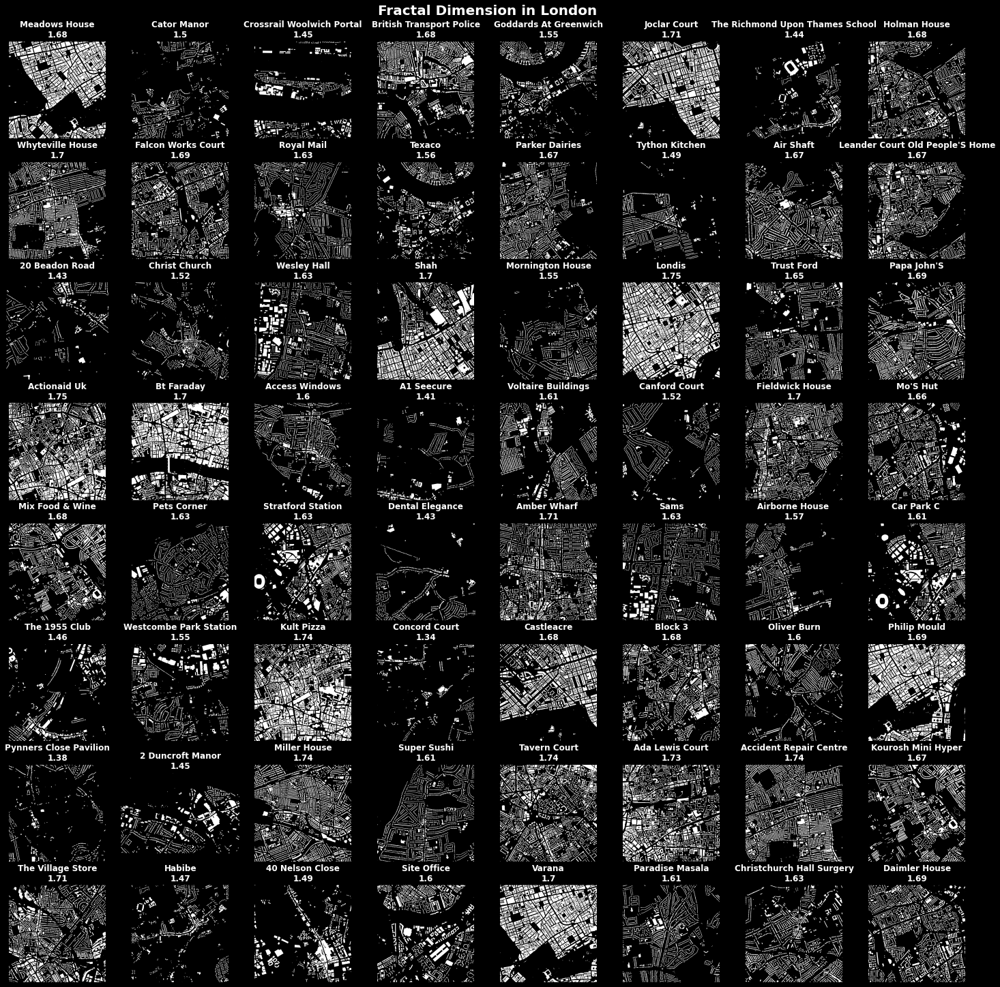

In [256]:
fig, axs = plt.subplots(8, 8, figsize=(20, 20), 
                        facecolor='k',
                        constrained_layout=True, 
                        subplot_kw=dict(aspect='equal'))

axs = axs.ravel()

for i in np.arange(0, results.shape[0]):
    
    building = results[results['index']==results['index'][i]]
    building.plot(ax=axs[i], color='w')
    
    axs[i].set_title(f"{building.name.iloc[0]}\n{round(building.fractal_dimension.iloc[0], 2)}", color='w', weight='bold')
    
    axs[i].margins(0)
    axs[i].axis('off')
    
fig.suptitle('Fractal Dimension in London', color='w', size=20, weight='bold')
fig.savefig('urban-fractality-london.png', facecolor=fig.get_facecolor(), dpi=300, bbox_inches='tight')

In [257]:
%%time
roads = osm.get_network(network_type="driving")
paths = osm.get_network(network_type="walking")

CPU times: user 1min 14s, sys: 2.11 s, total: 1min 16s
Wall time: 1min 16s


In [258]:
roads = roads.to_crs('epsg:27700')
paths = paths.to_crs('epsg:27700')

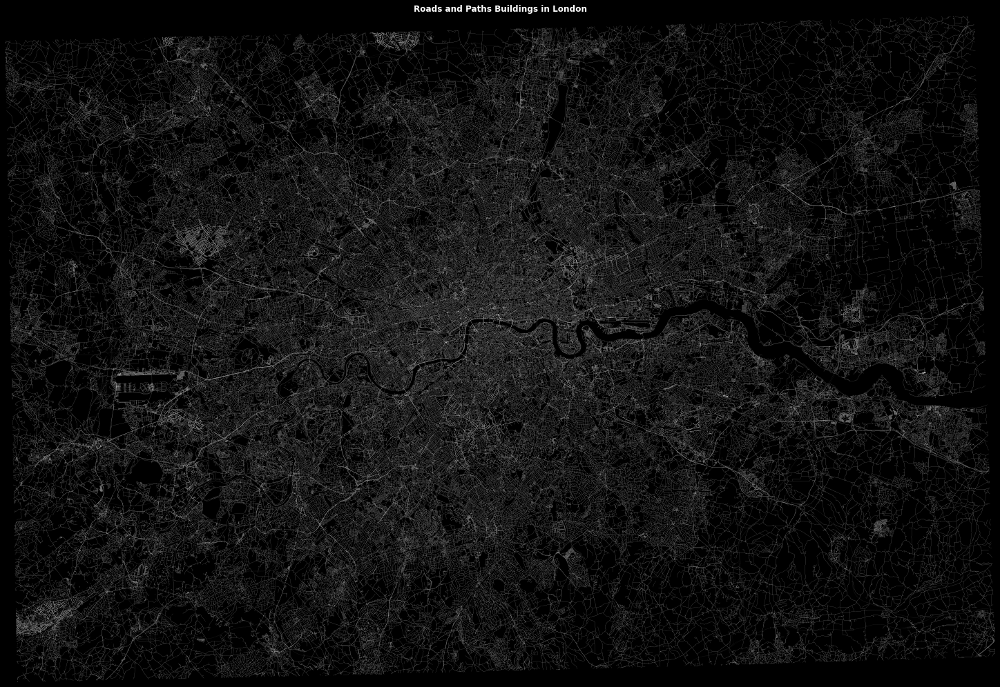

In [259]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1, figsize=(20, 20), 
                       facecolor='k',
                       constrained_layout=True, 
                       subplot_kw=dict(aspect='equal'))

roads.plot(ax=ax, color='w', alpha=0.5, lw=0.05)
paths.plot(ax=ax, color='w', alpha=1.0, lw=0.10)
    
ax.set_title("Roads and Paths Buildings in London", color='w', weight='bold')

ax.margins(0)
ax.axis('off')
    
fig.savefig('urban-morphology-london-roads.png', facecolor=fig.get_facecolor(), dpi=300, bbox_inches='tight')

In [298]:
def get_street_image(i):
    
    fig, ax = plt.subplots(1, 1, figsize=(20, 20), 
                           facecolor='w',
                           constrained_layout=True, 
                           subplot_kw=dict(aspect='equal'))    
    
    building = reresults[reresults['index']==results['index'][i]]
    building.plot(ax=ax, color='k')

    ax.margins(0)
    ax.axis('off')

    fig.canvas.draw()
    img = np.frombuffer(fig.canvas.tostring_rgb(), dtype="uint8")
    img = img.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    
    plt.clf()
    
    return img[:, :, 0]

In [294]:
def extract_roads(extractor, target=roads):
    intersect = gpd.overlay(roads, gpd.GeoDataFrame(geometry=gpd.GeoSeries(extractor, crs='epsg:27700')))
    dissolved = intersect.dissolve()
    
    return dissolved.geometry[0]

reresults = results['bounds'].apply(extract_roads)

In [295]:
reresults = gpd.GeoDataFrame(pd.DataFrame({'index': results['index']}), geometry=gpd.GeoSeries(reresults, crs='epsg:27700'))

In [301]:
%%time
D_s = []

for i in np.arange(0, results.shape[0]):
    
    p = get_street_image(i)
    d = fractal_dimension(p, threshold=0.25)
    
    D_s.append(d)
    
    plt.close('all')

CPU times: user 48.4 s, sys: 1.15 s, total: 49.5 s
Wall time: 21.1 s


In [303]:
results['fractal_dimension_streets'] = D_s

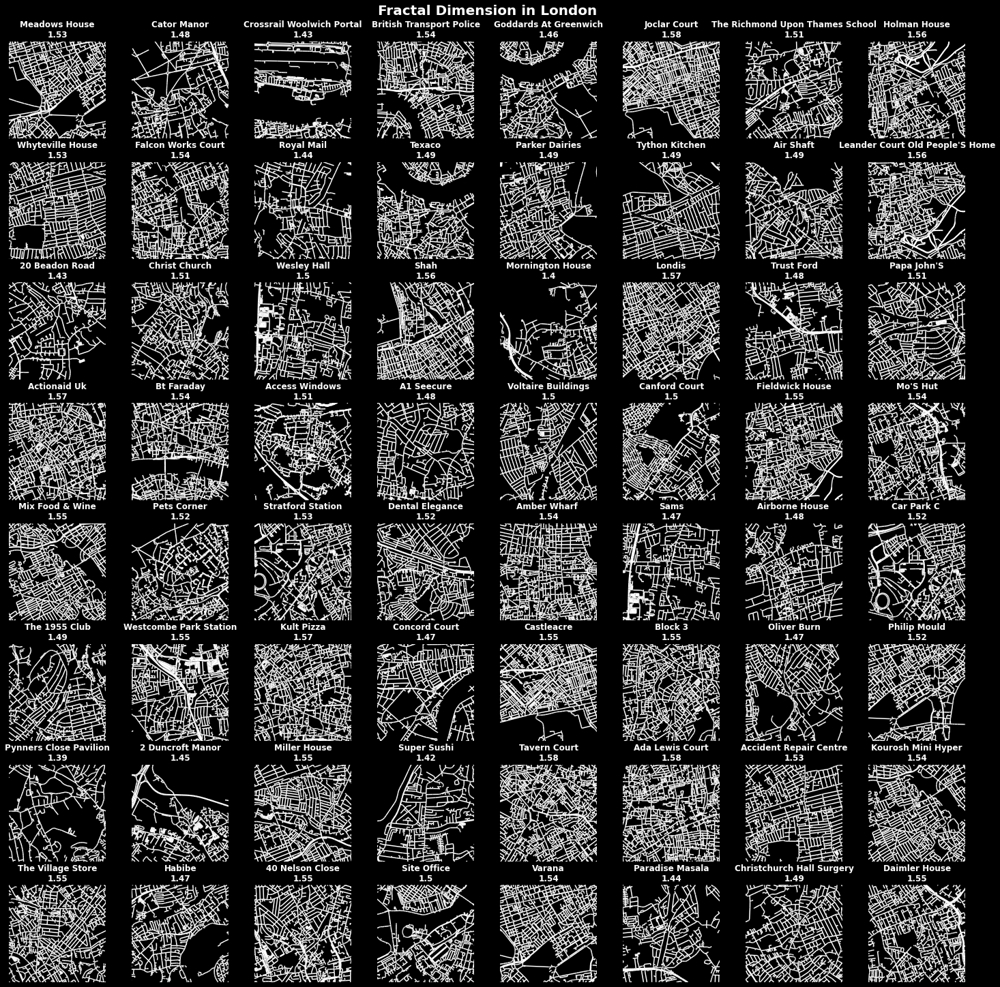

In [307]:
fig, axs = plt.subplots(8, 8, figsize=(20, 20), 
                        facecolor='k',
                        constrained_layout=True, 
                        subplot_kw=dict(aspect='equal'))

axs = axs.ravel()

for i in np.arange(0, results.shape[0]):
    
    building = reresults[reresults['index']==results['index'][i]]
    building.plot(ax=axs[i], color='w')
    
    info = results[results['index']==results['index'][i]]
    
    axs[i].set_title(f"{info.name.iloc[0]}\n{round(info.fractal_dimension_streets.iloc[0], 2)}", color='w', weight='bold')
    
    axs[i].margins(0)
    axs[i].axis('off')
    
fig.suptitle('Fractal Dimension in London', color='w', size=20, weight='bold')
fig.savefig('urban-fractality-london-streets.png', facecolor=fig.get_facecolor(), dpi=300, bbox_inches='tight')